In [ ]:
import pandas as pd

In [ ]:
import numpy as np

In [ ]:
import matplotlib.pyplot as plt

# End-to-end Multi-Class Dog Breed Classification

This notebook is built using Tensorflow and Tensorflow Hub

## 1. Problem
Identify breed of dog using its pictures.

## 2. Data
Kaggle(dog breed identification competition)

## 3. Evaluation
Multi class log loss

## 4. Features
* We're dealing with images (unstructured data) so we use deep/tranfer learning
* There are 120 breeds of dogs (120
different classes)
* There are 10K+ test set(no labels)
* There are 10K+ train set(labels)

## Get Our Workspace ready

In [ ]:
#Import Tensorflow to Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF hub version:", hub.__version__)

#CHeck for GPU Availability
print("GPU","available(yes!!!" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.11.0
TF hub version: 0.12.0
GPU available(yes!!!


## Getting our data ready (turning into tensors)

In [ ]:
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/Dog vision/labels.csv")
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<AxesSubplot:>

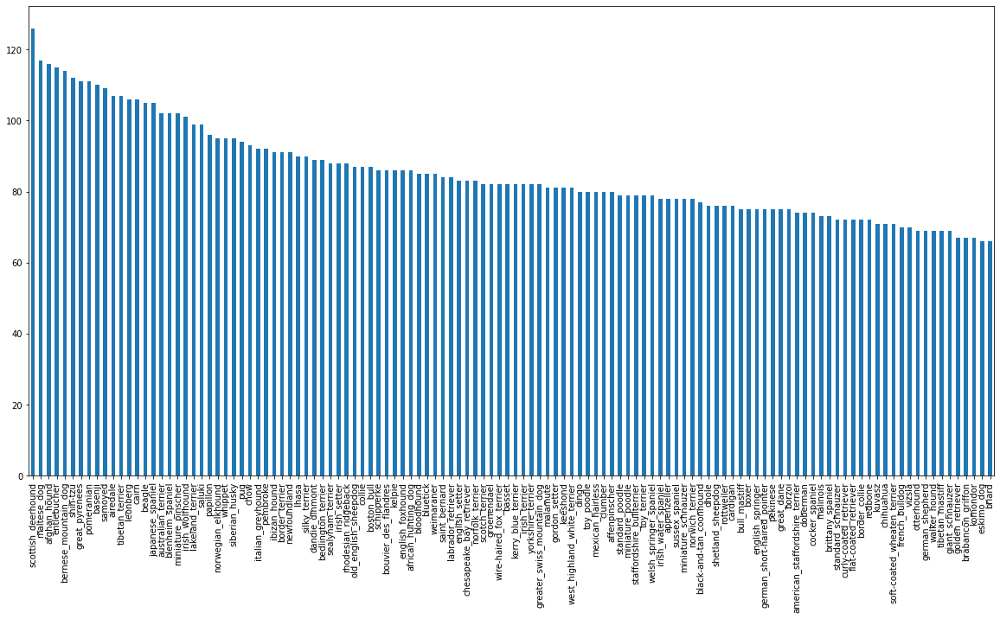

In [ ]:
#How many images are for each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

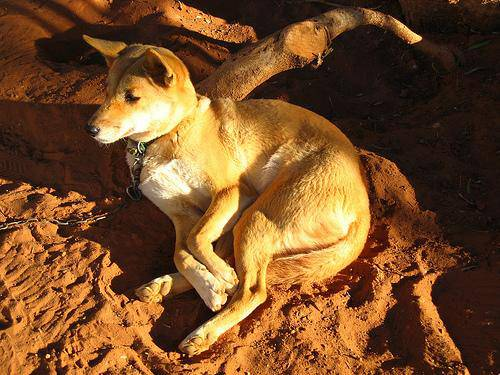

In [ ]:
#lets view an image
from IPython.display import Image
Image("drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

##Getting images and their labels

Let's get a list of all of our image file path names

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#Create path names
filename= ["drive/MyDrive/Dog vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

filename[:10]

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir("drive/MyDrive/Dog vision/train/")[:10]

['000bec180eb18c7604dcecc8fe0dba07.jpg',
 '001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '001cdf01b096e06d78e9e5112d419397.jpg',
 '00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '002211c81b498ef88e1b40b9abf84e1d.jpg',
 '00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '002a283a315af96eaea0e28e7163b21b.jpg',
 '003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
#Check whether no. of file names matches no. of actual files
if len(os.listdir("drive/MyDrive/Dog vision/train/")) == len(filename):
  print("Proceed")
else:
  print("Do not match ")

Proceed


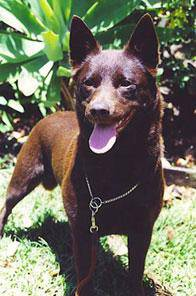

In [ ]:
Image(filename[800])


In [ ]:
print(labels_csv["breed"][800])

kelpie


Since we've got training image filepaths in a list lets prepare our labels

In [ ]:
labels=labels_csv["breed"]
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Check if no. of labels and no. of filenames are same
if len(labels)==len(filename):
  print("Matched")
else:
  print("Not matched")

Matched


In [ ]:
#Find unique label values
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [ ]:
#Turn every label into a boolean array
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
#Example: Turning boolean array into numbers
print(labels[0])  #Original label
print(np.where(unique_breeds==labels[0]))  # Index where label occurs
print(boolean_labels[0].argmax())   #Index where label occurs in boolean array
print(boolean_labels[0].astype(int))   #There will be a 1 where the label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[3])
print(boolean_labels[3].astype(int))

bluetick
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


##Creating our own validation set

In [ ]:
#Setup x and y variables
x=filename
y=boolean_labels

In [ ]:
len(x)

10222

We are going to start off with 1000 images and increase as we need

In [ ]:
#Set no. of images needed      #All capital name means it can be changes by user
NUM_IMAGES=1000 #@param {type:"slider",min:1000, max:10000,step:1000}

In [ ]:
#Lets split our data into train and validation set
from sklearn.model_selection import train_test_split

#Split these into training and validation of total size NUM_IMAGES
x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)
len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

#Preprocessing Images (Turning Images into tensors)

To do this:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable 'image'
3. Turn our 'image' into Tensor
4. Resize the 'image' to a shape of (224,224)
5.Return the modified 'image'

In [ ]:
#Convert image to Numpy array
from matplotlib.pyplot import imread
image=imread(filename[42])
image.shape

(257, 350, 3)

In [ ]:
image.max()

255

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]    #This is a tensor

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

##Now lets make a function for preprocessing so that we dont write all lines of code everytime

In [ ]:
#Define Image size
IMG_SIZE=224
#Create a function
def preprocess_img(image_path,img_size=IMG_SIZE):
  '''
  Takes an image file path and turns image into a Tensor
  '''
  #Read in an image file
  image=tf.io.read_file(image_path)
  #Turn the jpg image into numerical Tensor with 3 colour channels(Red, Green, blue)
  image=tf.image.decode_jpeg(image,channels=3)
  #Convert the colour channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)
  #Resize the image(224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

##Turning data into batches

Why turn data into batches ?
Lets say we process 10K+ images in one go , they might not fit in all memory .
SO thats why we do about 32 images(batch size) at a time.

In order to use tensorflow we need data in the form of tensor tuples like this:
 (image,label) pair.

In [ ]:
#Create a tensor tuple
def get_image_label(image_path,label):
  image=preprocess_img(image_path)
  return image,label

In [ ]:
#Create  batch size
BATCH_SIZE=32

#Create function to turn data into batches
def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Create batches of data out of images X and labels y pairs.
  Shuffles data if its training and doesnt if its validattion data.
  Also accept test data as input.
  """
  #If data is test data, we dont have labels
  if test_data:
    print("creating test data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))  #Only filepath no labels
    data_batch=data.map(preprocess_img).batch(BATCH_SIZE)
    return data_batch

  #If data is valid dataset, we dont need to shuffle it
  elif valid_data:
    print("Create validation dataset batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                             tf.constant(y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Create training data batches")
    #Turn filepaths and labels into tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                             tf.constant(y)))
    #Shuffle the pathnames and labels before mapping image processor function is faster than suffling images
    data=data.shuffle(buffer_size=len(x))
    data=data.map(get_image_label)

    #Turn traing data into batches
    data_batch=data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

Create training data batches
Create validation dataset batches


In [ ]:
#Check out different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
len(y[0])

120

#Visualizing data batches
Our data is in batches which is difficult to understand so we need to visualize them

In [ ]:
import matplotlib.pyplot as plt

#Create a function for view images in a data batch
def show_25_images(images,labels):
  plt.figure(figsize=(10,10))
  #Loop through 25
  for i in range(25):
    #Create subplots(5,5)
    ax=plt.subplot(5,5,i+1)
    #Display an image
    plt.imshow(images[i])
    #Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the grid lines off
    #plt.axis("off")

In [ ]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#len(train_images),len(train_labels)

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

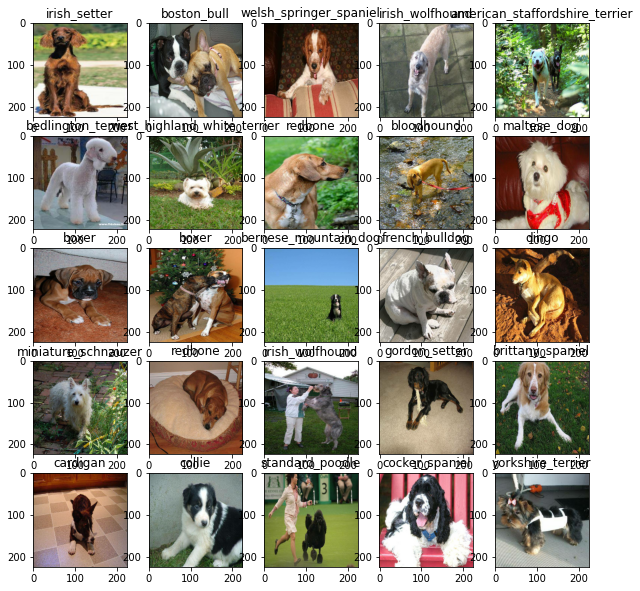

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
#Lets Visualize this
show_25_images(train_images,train_labels)

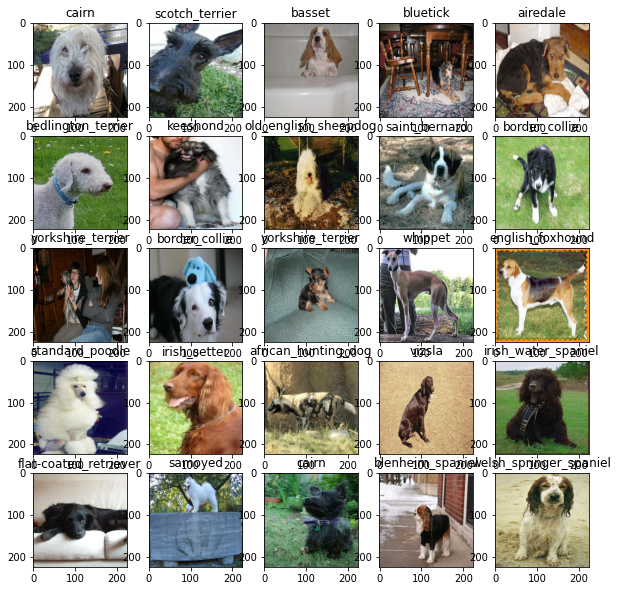

In [ ]:
val_images,val_labels=next(val_data.as_numpy_iterator())
#Lets Visualize this
show_25_images(val_images,val_labels)

## Building a model
Before we build a model, there are a few things we need to define :
1. input shape(our image shape, in form of tensors) to our model
2.Output shape(image labels, in form of tensors) of our model
3. URL of model we want to use


In [ ]:
#Setup input shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]    #batch,height,width,colour channels

#Setup Output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

#Setup model URL from Tensorflow Hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Lets create a function which
1. Takes input shape , output shape and model we've chosen as a parameter
2. Defines layers in a Keras model in sequential fashion
3. Compiles the model(evaluated and improved)
4. Builds the model(tells the model the input shape will be getting)
5. Returns the model

https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
#Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building Model with:",MODEL_URL)
  #sETUP THE MODEL LAYERS
  model=tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")
  ])
  #Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  #Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model=create_model()
model.summary()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
outputs=np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating Callbacks
Callbacks are helper function a model can use during training to do such things as save its progress, check its progress or  stop training early if a model stops improving.

We'll create two callbacks:

1. TensorBoard which helps in seeing the progress.
2. Early stopping which prevents from traing for too long

**Tensorboard Callback**
To setup this we need to do 3 things:
1. Load the Notebook extension.
2. Create a Tensorboard callback which is able to save logs to a directort and pass it to our model's fit() function.
3. Visualize our models training logs with the %tensorBoard Magic function

In [ ]:
#Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
#Create  a function to build the callback
def create_tensorboard_callback():
  # Create a log directory for storing  TEnsorBoard logs
  logdir=os.path.join("drive/MyDrive/Dog vision/logs",
                      #make it so the logs get tracked whenevr we run an experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


### Early Stopping Callback
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

Stops the model if an evaluation metric stops improving

In [ ]:
#Create early stopping
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

##Training a model(on subset of data)
Our first model is going to learn on only 1000 images so as to make sure everything is working fine

In [ ]:
NUM_EPOCHS=100 #@param{type:"slider",min:10,max:100}

In [ ]:
#Check to make sure we run on GPU
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


In [ ]:
#Build a function to train and return a trained model
def train_model():
  """
  Traains a model and returns the trained version
  """
  #create a model
  model=create_model()

  #Create new Tensorboard session everytime we train a model
  tensorboard=create_tensorboard_callback()

  #Fit the model to the data
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])

  #Return the model
  return model

In [ ]:
model=train_model()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 21s 160ms/step - loss: 4.5515 - accuracy: 0.1125 - val_loss: 3.4488 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 4s 144ms/step - loss: 1.6280 - accuracy: 0.7000 - val_loss: 2.1903 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 3s 122ms/step - loss: 0.5807 - accuracy: 0.9425 - val_loss: 1.7096 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 3s 120ms/step - loss: 0.2564 - accuracy: 0.9812 - val_loss: 1.5358 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 4s 162ms/step - loss: 0.1496 - accuracy: 0.9950 - val_loss: 1.4578 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 3s 122ms/step - loss: 0.1010 - accuracy: 1.0000 - val_loss: 1.4131 - val_accuracy: 0.6350
Epoch 7/100
25/25 [=============================

##Checking the Tensorboard logs
The Tensorboard magic function (%tensorboard ) will acccess the directory we created earlier and visualize it.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ vision/logs

<IPython.core.display.Javascript object>

#Making and evaluating predictions on trained model

In [ ]:
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 3s 93ms/step


array([[1.6161650e-03, 3.2100687e-04, 1.1048180e-03, ..., 7.4336038e-04,
        8.4235493e-05, 3.0878088e-03],
       [6.2207971e-04, 2.0085745e-03, 9.2050023e-03, ..., 3.4003858e-03,
        1.7515684e-03, 2.7240312e-04],
       [9.6802041e-06, 1.6967258e-04, 2.8276836e-04, ..., 2.1436090e-04,
        2.6278174e-04, 2.0276688e-04],
       ...,
       [8.1190337e-06, 1.6048155e-04, 4.3493241e-05, ..., 1.0666672e-05,
        5.6660076e-04, 9.5224452e-05],
       [2.3924427e-03, 1.5161450e-04, 1.3523600e-04, ..., 2.7110431e-04,
        4.3281932e-05, 1.7921491e-02],
       [3.7340354e-04, 2.3479524e-05, 2.8872970e-03, ..., 1.9272782e-03,
        8.7960315e-04, 2.7036213e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(unique_breeds)

120

In [ ]:
len(y_val)

200

In [ ]:
predictions[0]

array([1.6161650e-03, 3.2100687e-04, 1.1048180e-03, 3.1117743e-04,
       4.4147245e-04, 8.4265899e-05, 6.3516788e-02, 2.2230111e-04,
       1.7725740e-04, 1.4313206e-03, 7.3031982e-04, 8.2134822e-04,
       1.0966715e-04, 2.6307165e-04, 2.0579070e-04, 2.8122526e-03,
       1.0030538e-04, 1.8955716e-01, 8.0693841e-05, 3.2446311e-05,
       6.2022271e-04, 2.6564088e-04, 8.5054262e-06, 2.5164913e-03,
       4.4497254e-05, 1.9721214e-04, 1.2841871e-01, 5.0869872e-05,
       2.9920731e-04, 5.4882671e-04, 1.6680290e-03, 2.7068960e-03,
       3.5704137e-04, 3.3770455e-04, 3.8663423e-04, 8.4505208e-02,
       1.9900270e-05, 1.0889779e-03, 2.6419916e-04, 8.2573539e-04,
       2.3476577e-03, 9.7817756e-05, 3.4703738e-05, 5.8589965e-05,
       1.7237957e-05, 1.6508126e-04, 2.7846438e-05, 1.3582238e-03,
       6.9383584e-04, 2.4621631e-04, 1.8259189e-04, 1.5687609e-04,
       5.6610256e-04, 1.2504509e-04, 1.8525860e-04, 8.5435619e-05,
       4.7871252e-04, 1.1170200e-03, 2.8883055e-04, 1.1760573e

In [ ]:
#First prediction
index=42
print(predictions[index])
print(f"Max Value(probabliti of prediction):{np.max(predictions[index])}")
print(f"Sum:{np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.5435441e-04 3.7234247e-04 2.9059048e-04 4.1581225e-05 2.1773824e-03
 9.0057489e-05 7.8658530e-05 1.7807566e-03 1.5934817e-02 2.1459779e-02
 4.2294800e-05 7.1468487e-05 1.0736402e-03 9.7871404e-03 6.6473865e-04
 3.8835071e-03 5.9476133e-05 2.1054370e-04 1.5295630e-04 1.1125526e-03
 1.6013080e-05 8.3064480e-04 2.2311027e-04 5.1571307e-05 4.8852353e-03
 9.8599325e-05 7.2476003e-05 5.2662491e-04 1.1336553e-04 6.7271350e-05
 1.1439664e-04 1.3252231e-04 6.9225978e-05 1.0229287e-04 2.0447173e-04
 1.0250336e-05 1.8960729e-04 3.8054903e-04 8.2806269e-05 2.1093926e-01
 2.2080221e-04 8.6618180e-05 1.9009144e-03 1.5694663e-05 2.5074679e-04
 4.7124078e-05 8.4702141e-04 1.1813407e-03 5.6232890e-05 6.1993167e-04
 9.1006499e-05 1.3658412e-04 1.0413931e-03 6.4922017e-03 1.8975516e-05
 8.5418823e-04 1.4192102e-04 2.0403277e-05 2.4851100e-04 1.3223752e-04
 2.9085192e-04 9.2851551e-04 2.2835902e-05 7.9740108e-05 2.8697198e-04
 2.6551244e-04 6.6930530e-05 9.4929495e-04 4.2834929e-03 1.5836678e-04
 2.300

In [ ]:
unique_breeds[113]

'walker_hound'

Having the above functionality is great but we want to do it at scale .

And it would be better if we could see the image of the prediction

**Note**:Prediction probabilities are also called confidence levels

In [ ]:
#Turn Prediction probabilties into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns array of prediction into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

#Get a predicted label based on prediction probabilites
pred_label=get_pred_label(predictions[13])
pred_label

'italian_greyhound'

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since the val data is still batch dataset we need to un batch them to make predictions on val images and compare those predictions to validation labels(truth labels)

In [ ]:
#Create a function to unbatch the dataset
def unbatchify(data):
  images=[]
  labels=[]
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

#Unbatchify the validation dataset
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
get_pred_label(predictions[0])

'border_terrier'

Now we've got :
* Prediction labels
* Validation labels(truth labels)
* Validation images

Lets Visualize them

We'll create a function which:
* Takes an array of probabilties an array of truth labels and array of images and integers.
* Convert the prediction probabilties to a predicted label
* Plot the predicted label, its predicted probability , the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  #Gete the pred label
  pred_label=get_pred_label(pred_prob)

  #Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #CHange the color of the title depending on prediction is right or wrong
  if pred_label==true_label:
    color='green'
  else:
    color='red'
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

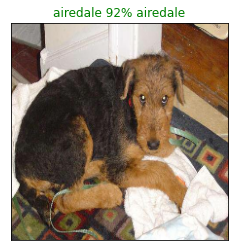

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=4)

Now we've got one function to visualize our model top predictions lets make another to view our model top 10 predictions.

This funcgtion will:
* Take an input of prediction probabilites array and a ground truth arrray and an integer
* Find the prediction using get_pred_label()
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilites values
  * Prediction labesl
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plus the top 10 highest prediction along with the truth labe; for sample n.
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]

  pred_label=get_pred_label(pred_prob)

  #Find top 10 prediction confidence indexes
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  #Find the top 10 prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  #Find top 10 pred labels
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  #Change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass


In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]]         #Tells the indexes rankings

array([0.18955716, 0.12841871, 0.11760573, 0.08450521, 0.07362352,
       0.06351679, 0.04311315, 0.03548196, 0.03304309, 0.02849264],
      dtype=float32)

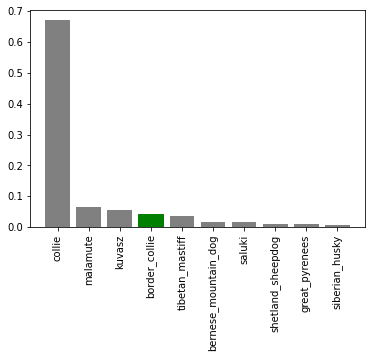

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

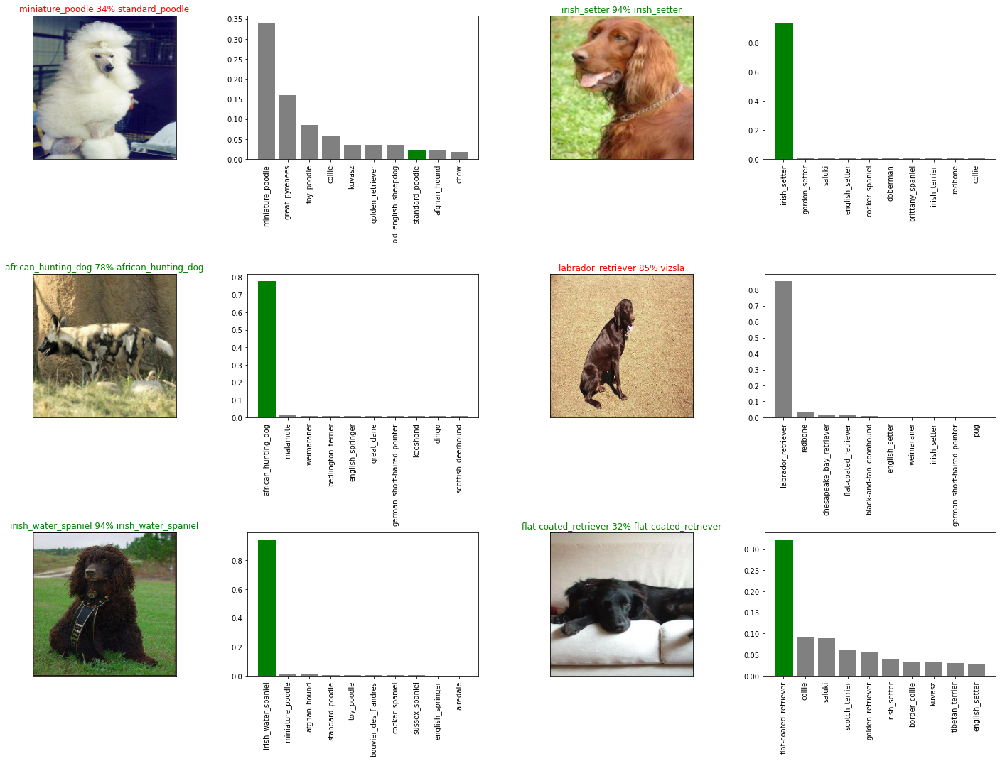

In [ ]:
#Lets check out a few predictions
i_multiplier=15
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

#Saving and Realoading a trained model

In [ ]:
#Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in models directory and appends a suffix(string)
  """
  #Create a model directory with current time
  modeldir=os.path.join("drive/MyDrive/Dog vision/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir + "-" + suffix + ".h5"   #save format of model
  print(f"Saving model to: {model_path}....")
  model.save(model_path)
  return model_path

In [ ]:
#Function to load a model
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
#Lets make sure they work
save_model(model,suffix="1000-images-mobile-netv2")

Saving model to: drive/MyDrive/Dog vision/models/20230225-12411677328876-1000-images-mobile-netv2.h5....


'drive/MyDrive/Dog vision/models/20230225-12411677328876-1000-images-mobile-netv2.h5'

In [ ]:
#Load the trained model
loaded_images_1000_model=load_model("drive/MyDrive/Dog vision/models/20230225-12411677328876-1000-images-mobile-netv2.h5")

Loading saved model from: drive/MyDrive/Dog vision/models/20230225-12411677328876-1000-images-mobile-netv2.h5


In [ ]:
#Evaluate the presaved model
model.evaluate(val_data)

7/7 [==============================] - 2s 202ms/step - loss: 1.3623 - accuracy: 0.6400


[1.3622528314590454, 0.6399999856948853]

In [ ]:
#Evaluate the loaded model
loaded_images_1000_model.evaluate(val_data)

7/7 [==============================] - 5s 121ms/step - loss: 1.3623 - accuracy: 0.6400


[1.3622528314590454, 0.6399999856948853]

In [ ]:
#Training a big dog model on the full data
len(x),len(y),len(x_train)

(10222, 10222, 800)

In [ ]:
#Create a data batch with full data set
full_data=create_data_batches(x,y)

Create training data batches


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#Create a model for full model
full_model=create_model()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
#Create callbacks for full model
full_model_tensorboard=create_tensorboard_callback()
#no valdation set when training on all data so we cant monitor val accuracy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                           patience=3)

In [ ]:
#Fit in the full model
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 45s 121ms/step - loss: 1.3526 - accuracy: 0.6673
Epoch 2/100
320/320 [==============================] - 37s 115ms/step - loss: 0.3976 - accuracy: 0.8841
Epoch 3/100
320/320 [==============================] - 36s 112ms/step - loss: 0.2365 - accuracy: 0.9362
Epoch 4/100
320/320 [==============================] - 37s 115ms/step - loss: 0.1531 - accuracy: 0.9649
Epoch 5/100
320/320 [==============================] - 50s 156ms/step - loss: 0.1072 - accuracy: 0.9784
Epoch 6/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0753 - accuracy: 0.9886
Epoch 7/100
320/320 [==============================] - 37s 117ms/step - loss: 0.0595 - accuracy: 0.9907
Epoch 8/100
320/320 [==============================] - 36s 112ms/step - loss: 0.0444 - accuracy: 0.9938
Epoch 9/100
320/320 [==============================] - 36s 112ms/step - loss: 0.0370 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 35s 110m

In [ ]:
save_model(full_model,suffix="full-image-set-mobilenetv2")

Saving model to: drive/MyDrive/Dog vision/models/20230225-13161677330989-full-image-set-mobilenetv2.h5....


'drive/MyDrive/Dog vision/models/20230225-13161677330989-full-image-set-mobilenetv2.h5'

In [ ]:
#Load the full model
loaded_full_model=load_model('drive/MyDrive/Dog vision/models/20230225-13161677330989-full-image-set-mobilenetv2.h5')

Loading saved model from: drive/MyDrive/Dog vision/models/20230225-13161677330989-full-image-set-mobilenetv2.h5


#Making the predictions on the test dataset

In [ ]:
#Load test image filename
test_path="drive/MyDrive/Dog vision/test/"
test_filenames=[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog vision/test/000621fb3cbb32d8935728e48679680e.jpg',
 'drive/MyDrive/Dog vision/test/00102ee9d8eb90812350685311fe5890.jpg',
 'drive/MyDrive/Dog vision/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'drive/MyDrive/Dog vision/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'drive/MyDrive/Dog vision/test/001a5f3114548acdefa3d4da05474c2e.jpg',
 'drive/MyDrive/Dog vision/test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 'drive/MyDrive/Dog vision/test/002c2a3117c2193b4d26400ce431eebd.jpg',
 'drive/MyDrive/Dog vision/test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 'drive/MyDrive/Dog vision/test/002f80396f1e3db687c5932d7978b196.jpg',
 'drive/MyDrive/Dog vision/test/0036c6bcec6031be9e62a257b1c3c442.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
#Create test data batch
test_data= create_data_batches(test_filenames,test_data=True)

creating test data batches


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#Make predictions on test data batch using loaded full model
test_predictions=loaded_full_model.predict(test_data,
                                           verbose=1)

324/324 [==============================] - 39s 118ms/step


In [ ]:
#Save predictions (Numpy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog vision/preds_array.csv",test_predictions,delimiter=",")

In [ ]:
#Load predictions from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog vision/preds_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.35152542e-10, 5.03701525e-11, 1.01663632e-13, ...,
        3.37076070e-13, 1.30727329e-09, 1.26107277e-10],
       [1.52209861e-06, 1.38014525e-06, 1.79303868e-07, ...,
        4.92180983e-11, 3.40408576e-07, 5.32692956e-09],
       [2.39753578e-10, 3.54249732e-06, 1.83307449e-08, ...,
        3.91756686e-07, 3.00351521e-10, 4.99247310e-10],
       ...,
       [2.24810459e-09, 2.34065628e-10, 4.05482620e-10, ...,
        4.78636792e-12, 9.06067756e-12, 2.63197630e-10],
       [2.13728670e-11, 2.14722995e-09, 2.64498812e-10, ...,
        4.79312746e-07, 1.32071518e-08, 2.16485441e-10],
       [2.98685379e-08, 3.25266827e-11, 8.45402026e-10, ...,
        6.40332015e-12, 3.72520730e-11, 3.26950925e-07]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing the test dataset predictions for kaggle
Looking at the kaggle sample submission , we find that it wants our models prediction probability output in a dataframe with an id and a column for each different dog breed.

To get the data in this format we'll :
* Create a pandas Dataframe with an ID column as well as a column for each dog breed
* add data to the ID column by extracting the test image ID's fromthe filepaths
* add data(the prediction probabilities) to each of the dog breed columns
* Export The dataframe as a CSV to submit to kaggle

In [ ]:
#Create a pandas Dataframe with empty columns
preds_df=pd.DataFrame(columns=["id"]+ list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_filenames[:10]

['drive/MyDrive/Dog vision/test/000621fb3cbb32d8935728e48679680e.jpg',
 'drive/MyDrive/Dog vision/test/00102ee9d8eb90812350685311fe5890.jpg',
 'drive/MyDrive/Dog vision/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'drive/MyDrive/Dog vision/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'drive/MyDrive/Dog vision/test/001a5f3114548acdefa3d4da05474c2e.jpg',
 'drive/MyDrive/Dog vision/test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 'drive/MyDrive/Dog vision/test/002c2a3117c2193b4d26400ce431eebd.jpg',
 'drive/MyDrive/Dog vision/test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 'drive/MyDrive/Dog vision/test/002f80396f1e3db687c5932d7978b196.jpg',
 'drive/MyDrive/Dog vision/test/0036c6bcec6031be9e62a257b1c3c442.jpg']

In [ ]:
#Append test image ID to dataframe
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [ ]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/Dog vision/test/000621fb3cbb32d8935728e48679680e', '.jpg')

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00102ee9d8eb90812350685311fe5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0012a730dfa437f5f3613fb75efcd4ce,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001510bc8570bbeee98c8d80c8a95ec1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,001a5f3114548acdefa3d4da05474c2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,1.351525e-10,5.037015e-11,1.016636e-13,6.577838e-13,8.893348e-13,7.236581e-11,7.583206e-15,2.597628e-12,6.729384e-13,...,1.357261e-12,1.174021e-12,2.634747e-13,9.304229e-14,5.701163e-13,1.037043e-11,1.750858e-12,3.370761e-13,1.307273e-09,1.261073e-10
1,00102ee9d8eb90812350685311fe5890,1.522099e-06,1.380145e-06,1.793039e-07,5.977758e-09,1.841374e-06,6.498100e-08,2.784848e-06,1.052689e-06,7.893310e-08,...,2.010954e-07,9.438333e-07,1.251259e-08,1.033021e-05,2.926049e-07,5.398030e-07,7.580296e-04,4.921810e-11,3.404086e-07,5.326930e-09
2,0012a730dfa437f5f3613fb75efcd4ce,2.397536e-10,3.542497e-06,1.833074e-08,4.645208e-09,1.230815e-09,4.388210e-08,2.103300e-10,1.378444e-10,1.779257e-08,...,9.008406e-11,5.255388e-11,3.236671e-07,3.041393e-06,6.625297e-08,3.435755e-07,3.931300e-12,3.917567e-07,3.003515e-10,4.992473e-10
3,001510bc8570bbeee98c8d80c8a95ec1,1.161689e-05,1.095717e-06,1.164552e-06,6.522138e-06,1.503673e-05,1.815182e-06,5.262859e-11,5.840257e-09,5.387056e-08,...,7.184077e-07,1.409995e-09,9.251519e-06,3.684008e-09,3.386075e-06,3.475993e-10,1.647976e-14,1.994283e-03,9.112992e-11,1.855192e-07
4,001a5f3114548acdefa3d4da05474c2e,1.888648e-04,1.162891e-05,9.746499e-09,1.577733e-09,2.813644e-09,2.176470e-11,1.027516e-09,7.063900e-09,2.354209e-08,...,2.259557e-07,1.034523e-10,1.599018e-10,4.191011e-10,1.788433e-09,2.684946e-09,2.398332e-10,7.666577e-09,1.321550e-10,5.368546e-08


In [ ]:
#Save our predictions dataframne to CSv file
preds_df.to_csv("drive/MyDrive/Dog vision/full_model_preds_submission_mobilnetv2.csv",
                index=False)

#Making predictions on custom images
To make predictions on custom images, we'll:
* Get the filepaths of our own images
* Turn the filepaths into data batches using 'create_data_batches()'. And since our custom images wont have labels we set the test_data parameter to True
* Pass the custom image data batch to our model's predict() method
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
#Get the custom image filepaths
custom_path="drive/MyDrive/Dog vision/my_dog_pics/"
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog vision/my_dog_pics/dog-photo-2.jpg',
 'drive/MyDrive/Dog vision/my_dog_pics/dog-photo-1.jpg']

In [ ]:
os.listdir(custom_path)

['dog-photo-2.jpg', 'dog-photo-1.jpg']

In [ ]:
#Turn custom images into data batch
custom_data=create_data_batches(custom_image_paths,test_data=True)
custom_data

creating test data batches


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds=loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds.shape

(2, 120)

In [ ]:
#Get custom image prediction labels
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels



['labrador_retriever', 'golden_retriever']

In [ ]:
#Get custom images
custom_images=[]
#Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)


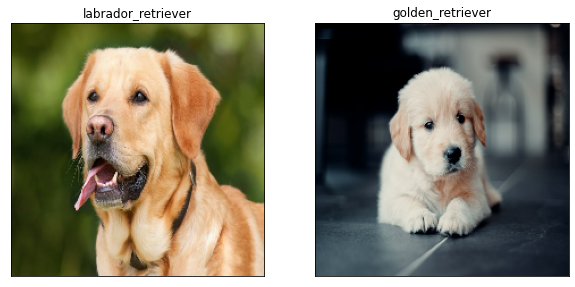

In [ ]:
#Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,2,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)